In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os 
import sys

sys.path.append('../../boxcox')
sys.path.append('../../comparison')
sys.path.append('../../dCor')
sys.path.append('../../local_maximal_corr')
sys.path.append('../../MCI')

from img_comparison import compare_images

from scipy.spatial import distance
from main_lmc import LocalMaximalCorr
from minepy import MINE
import dcor 

from scipy.stats import pearsonr

In [22]:
def get_all_comp(img_1, img_2, method = 'full'):

    comp = compare_images(img_1, img_2)

    # dcor
    dcorr_func = lambda x, y: dcor.distance_correlation(x, y)
    dcor_res = comp.compare_images(function=dcorr_func, comparison_method= method)

    dcov_func = lambda x, y: dcor.distance_covariance(x, y)
    dcov_res = comp.compare_images(function=dcov_func, comparison_method= method)

    # # lmc
    # lmc = lambda x, y: LocalMaximalCorr(x, y).local_maximal_corr()[0]
    # lmc_res = comp.compare_images(function=lmc, comparison_method= method)

    # mic
    def mic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.mic()
    
    mic_e = lambda x, y:  mic(x, y)
    mic_e_res = comp.compare_images(function=mic_e, comparison_method= method)

    # tic
    def tic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.tic()
    tic_e = lambda x, y:  tic(x, y)
    tic_e_res = comp.compare_images(function=tic_e, comparison_method= method)


    # corr
    corr = lambda x, y: pearsonr(x, y)[0]
    corr_res = comp.compare_images(function=corr, comparison_method= method)

    return dcor_res,dcov_res , mic_e_res, tic_e_res, corr_res


    

In [23]:
images_df_full = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])

images_df_hist = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])


In [24]:
from box_cox_img import BoxCoxImg
import matplotlib.pyplot as plt

from tqdm import tqdm

for i in tqdm(range(1, 23)):
    img_path = f'../../boxcox/img/{i}.png'
    
    BCI = BoxCoxImg(img_path)
    # plt.imshow(BCI.bw_img, cmap='gray')
    # plt.show()

    for lmbda in np.linspace(-5, 5, 31):

        #full
        full_bc = BCI.transform(method='full', lam= lmbda)
        # plt.imshow(full_bc, cmap='gray')
        # plt.show()

        plt.show()

        dcor_full_full, dcov_full_full ,mic_full_full, tic_full_full, corr_full_full = get_all_comp(BCI.bw_img, full_bc, method='full')
        print(f'full bc, full comp: dcor={dcor_full_full}, dcov={dcov_full_full}, mic={mic_full_full}, tic={tic_full_full}, corr={corr_full_full}')

        dcor_hist_full, dcov_hist_full ,mic_hist_full, tic_hist_full, corr_hist_full = get_all_comp(BCI.bw_img, full_bc, method='hist')
        print(f'full bc, hist comp: dcor={dcor_hist_full}, dcov={dcov_hist_full}, mic={mic_hist_full}, tic={tic_hist_full}, corr={corr_hist_full}')

        images_df_full = pd.concat([images_df_full, pd.DataFrame([[i, lmbda, dcor_full_full, dcov_full_full, mic_full_full, tic_full_full, corr_full_full]]
                                                                , columns=images_df_full.columns)], ignore_index=True)
                                                                


        images_df_hist = pd.concat([images_df_hist, pd.DataFrame([[i, lmbda, dcor_hist_full, dcov_hist_full, mic_hist_full, tic_hist_full, corr_hist_full]]
                                                                , columns=images_df_hist.columns)], ignore_index=True)
        
    #     break
    images_df_full.to_csv('./images_lam_df_full.csv')
    images_df_hist.to_csv('./images_lam_df_hist.csv')
    # break


images_df_full.to_csv('./images_lam_df_full_end.csv')
images_df_hist.to_csv('./images_lam_df_hist_end.csv')


images_df_full = pd.read_csv('./images_lam_df_full_end.csv', index_col=0)
images_df_hist = pd.read_csv('./images_lam_df_hist_end.csv', index_col=0)

  0%|          | 0/22 [00:00<?, ?it/s]/home/fcastellano/.conda/envs/memoria/lib/python3.10/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float32, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847


/home/fcastellano/.conda/envs/memoria/lib/python3.10/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(int64, 1d, C), array(int64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/tmp/ipykernel_80341/599046459.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  images_df_full = pd.concat([images_df_full, pd.DataFrame([[i, lmbda, dcor_full_full, dcov_full_full, mic_full_full, tic_full_full, corr_full_full]]
/tmp/ipykernel_80341/599046459.py:33: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA ent

full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, ti

  5%|▍         | 1/22 [53:41<18:47:28, 3221.34s/it]

full bc, full comp: dcor=0.9240821072543721, dcov=0.050610223666854, mic=0.9999999932711469, tic=13346.369527116707, corr=0.7274419363173378
full bc, hist comp: dcor=0.30820956001728883, dcov=424.7028104705347, mic=0.37749804587096436, tic=9.973180749083372, corr=-0.14033585694419737
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, corr=0.17057910953780192
full bc, hist comp: dcor=0.0343067739429946, dcov=75.01761525236697, mic=0.03460162379961953, tic=0.7056682044922881, corr=-0.020199363420661372
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, corr=0.17057910953780192
full bc, hist comp: dcor=0.0343067739429946, dcov=75.01761525236697, mic=0.03460162379961953, tic=0.7056682044922881, corr=-0.020199363420661372
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, cor

  9%|▉         | 2/22 [1:45:40<17:33:47, 3161.36s/it]

full bc, full comp: dcor=0.7195110734347845, dcov=0.010508566160870392, mic=0.9999999995231517, tic=13350.617799177093, corr=0.675597529523371
full bc, hist comp: dcor=0.053259670444209546, dcov=105.23361625980189, mic=0.2945676803324132, tic=9.37141891509846, corr=-0.015185343935606232
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, corr=0.11428947061051595
full bc, hist comp: dcor=0.06496486227047873, dcov=121.63380400656406, mic=0.0320523647599259, tic=0.6661253220522799, corr=-0.05277870701268142
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, corr=0.11428947061051595
full bc, hist comp: dcor=0.06496486227047873, dcov=121.63380400656406, mic=0.0320523647599259, tic=0.6661253220522799, corr=-0.05277870701268142
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, 

In [6]:
images_df_full

,n_image,lambda,dcor,dcov,mic,tic,pearson
0,1,-5.000000,0.000000,0.000000,0.020393,186.260475,0.121263
1,1,-4.666667,0.000000,0.000000,0.020393,186.260475,0.121263
2,1,-4.333333,0.000000,0.000000,0.020393,186.260475,0.121263
3,1,-4.000000,0.000000,0.000000,0.020393,186.260475,0.121263
4,1,-3.666667,0.000000,0.000000,0.020393,186.260475,0.121263
...,...,...,...,...,...,...,...
119,22,3.666667,0.945256,0.074533,1.000000,13345.270160,0.861159
120,22,4.000000,0.931449,0.069970,1.000000,13345.273505,0.834720
121,22,4.333333,0.915789,0.065600,1.000000,13345.270007,0.808352
122,22,4.666667,0.898505,0.061481,1.000000,13345.268642,0.782483


In [20]:
images_df_hist.n_image.unique()

array([ 1,  2, 13, 22])

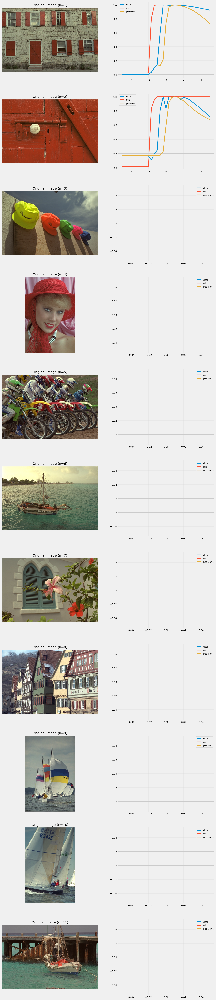

In [17]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(11, 4, figsize=(15, 75))
j = 0

for n_im in ims:

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()



plt.show()


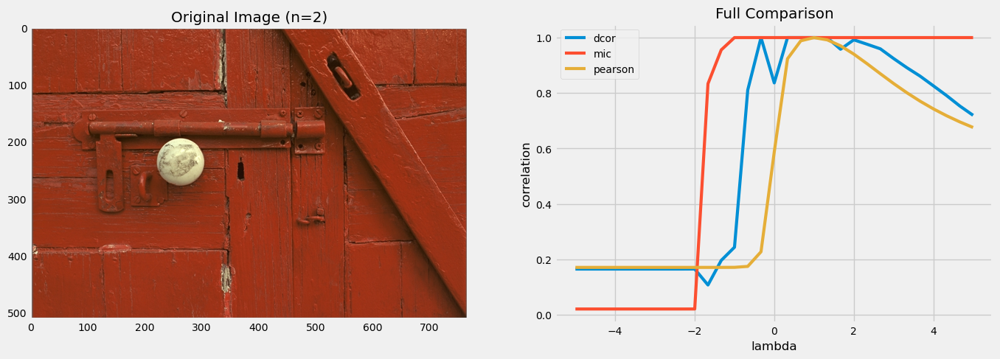

In [8]:
# plot lambda vs dcor, mic, pearson in df

n_im = 2

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



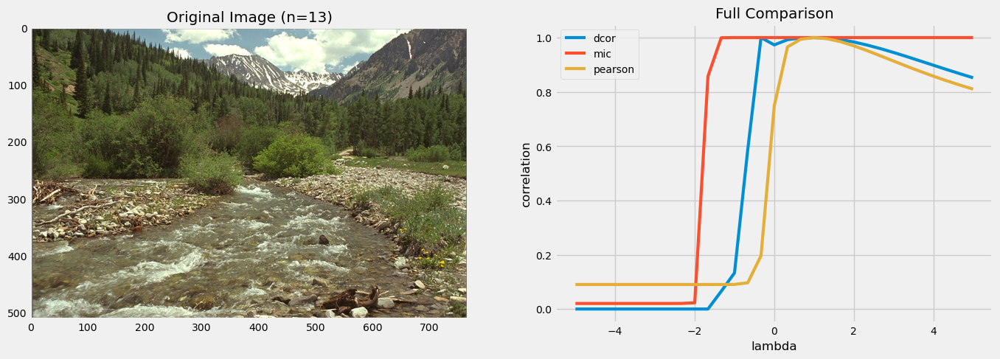

In [9]:
# plot lambda vs dcor, mic, pearson in df

n_im = 13

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



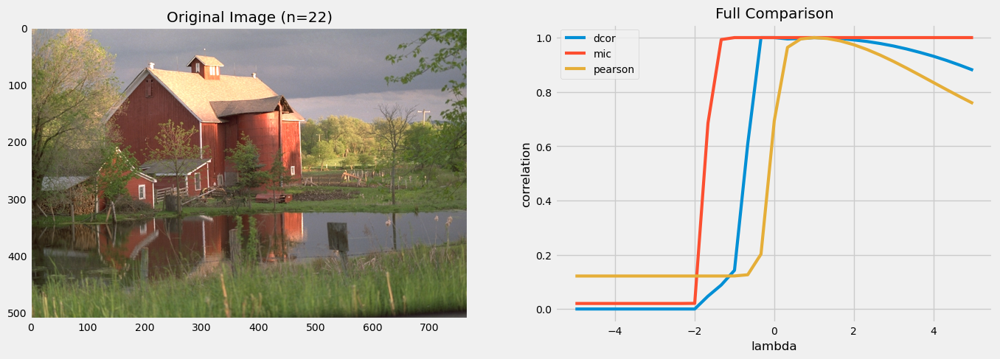

In [10]:
# plot lambda vs dcor, mic, pearson in df

n_im = 22

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



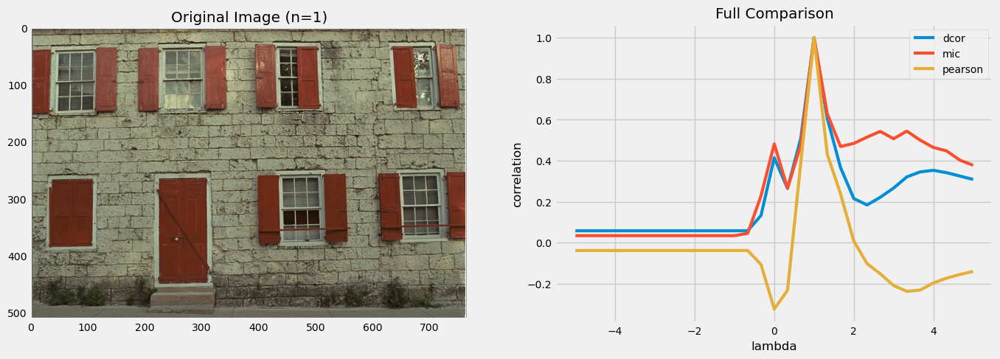

In [11]:
# plot lambda vs dcor, mic, pearson in df

n_im = 1

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



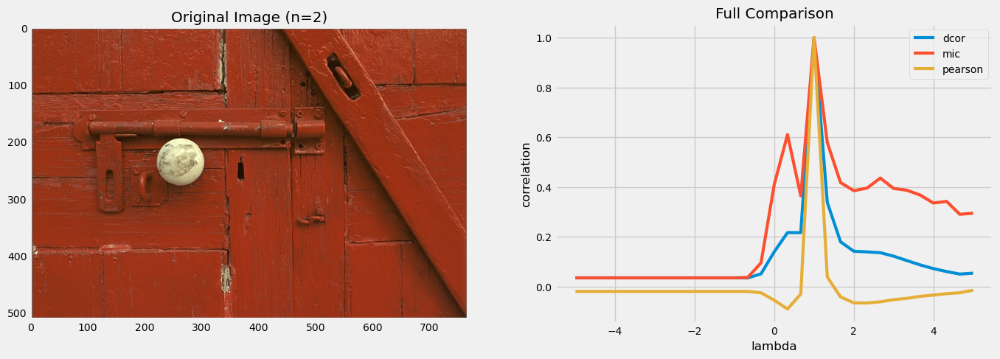

In [12]:
# plot lambda vs dcor, mic, pearson in df

n_im = 2

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



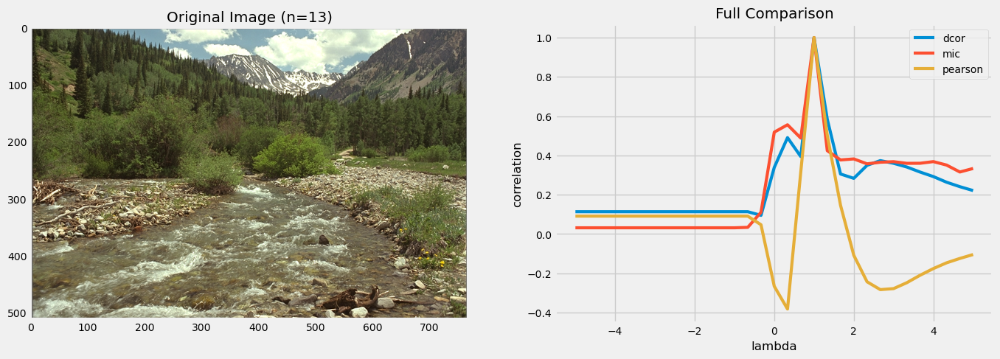

In [13]:
# plot lambda vs dcor, mic, pearson in df

n_im = 13

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



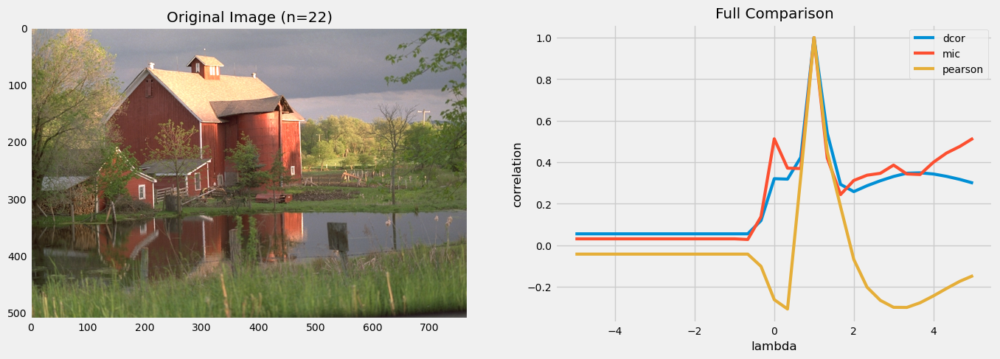

In [14]:
# plot lambda vs dcor, mic, pearson in df

n_im = 22

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()

